In [1]:
import os
import requests
import pandas as pd
import nltk
from nltk.corpus import stopwords
import numpy as np

In [2]:
os.chdir("..")

In [3]:


def download_csv(url, save_path):
  # Get the content of the CSV file from the given URL
  response = requests.get(url)

  # Open the file in write mode
  with open(save_path, 'w') as file:
    # Write the content of the CSV file to the file
    file.write(response.text)

In [4]:
url_train = 'https://raw.githubusercontent.com/dumitrescustefan/Romanian-Transformers/examples/examples/sentiment_analysis/ro/train.csv'
url_test = 'https://raw.githubusercontent.com/dumitrescustefan/Romanian-Transformers/examples/examples/sentiment_analysis/ro/test.csv'
save_path_train = 'data/ro_sent_train.csv'
save_path_test = 'data/ro_sent_test.csv'



In [5]:
download_csv(url_train, save_path_train)
download_csv(url_test, save_path_test)

In [6]:
def load_ro_sent_train(save_path_train):
    return pd.read_csv(save_path_train, encoding="utf-8", index_col="index")

In [7]:
def load_ro_sent_test(save_path_test):
    return pd.read_csv(save_path_test, encoding="utf-8",  index_col="Unnamed: 0")

In [8]:
ro_sent_train = load_ro_sent_train(save_path_train)
ro_sent_test = load_ro_sent_test(save_path_test)

In [9]:
ro_sent_train.head()

,text,label
index,,
0,acest document mi-a deschis cu adevarat ochii ...,1
1,tine mancarea rece. ce altceva ii mai trebuie?...,1
2,excelent\r\nrecomand!,1
3,"ca un rocker imbatranit, acest film mentioneaz...",1
4,"ei bine, a facut o groaza veche si foarte intu...",1


In [10]:
ro_sent_test.head()

,text,label
0,am vazut recent episoadele 1-4 si acum nu pot ...,1
1,anii cei mai buni ai vietii noastre capteaza p...,1
2,"aceasta apartine in clasa lor superioara, desi...",1
3,lucrare stralucitoare. actorii minunati se diz...,1
4,oamenii par sa se astepte la citizen kane aici...,1


In [11]:
def remove_romanian_stopwords(text):
    try:
        # get the list of Romanian stopwords from NLTK
        romanian_stopwords = stopwords.words('romanian')

        # split the text into a list of words
        words = text.split()

        # remove the stopwords from the list of words
        filtered_words = [word for word in words if word not in romanian_stopwords]

        # join the filtered words back into a single string
        filtered_text = ' '.join(filtered_words)

        return filtered_text
    except:
        return text

In [12]:
value = ro_sent_test.iloc[1]['text']
value

'anii cei mai buni ai vietii noastre capteaza perfect epoca tineretii mele si a sentimentelor din acea vreme. distributia a fost uniforma minunata. acesta a fost probabil cel mai bun rol al carierei lui dana andrews si ar fi trebuit, de asemenea, sa fie nominalizat la premiul oscar. exista atat de multe scene minunate in acest film, este aproape imposibil sa le enumeram pe toate. cinematografia este printre cele mai bune din orice film. acest film este o capsula de timp a ceea ce a fost ca in anii 1940. trebuie sa vezi filmul pentru orice fan adevarat. unii critici au spus ca acest film a imbatranit. nu sunt de acord. tema dorintelor umane este atemporala. si obstacolele cu care se confrunta veteranii care se intorc de la razboi vor fi intotdeauna cu noi. acesta este doar un film grozav - unul care poate fi urmarit mereu si repetat.'

In [13]:
no_stopwords = remove_romanian_stopwords(value)
no_stopwords

'anii buni vietii capteaza perfect epoca tineretii sentimentelor vreme. distributia uniforma minunata. probabil bun rol carierei dana andrews trebuit, asemenea, nominalizat premiul oscar. exista scene minunate film, aproape imposibil enumeram toate. cinematografia printre bune film. film capsula timp anii 1940. trebuie vezi filmul fan adevarat. critici spus film imbatranit. acord. tema dorintelor umane atemporala. obstacolele confrunta veteranii intorc razboi intotdeauna noi. film grozav - urmarit repetat.'

In [14]:
def remove_non_letters(text):
    try:  
        return ''.join(c for c in text if c.isalpha() or c.isspace())
    except:
        return text
        

In [15]:
import spacy

In [16]:
!python -m spacy download ro_core_news_sm

[+] Download and installation successful
You can now load the package via spacy.load('ro_core_news_sm')


You should consider upgrading via the 'C:\Misc\GIT\DLNLPProject\venv\Scripts\python.exe -m pip install --upgrade pip' command.


In [17]:
nlp = spacy.load("ro_core_news_sm")

In [18]:
def get_lemma(text):
    try:
        doc = nlp(text)
        empty_list = []
        for token in doc:
            empty_list.append(token.lemma_)

        final_string = ' '.join(map(str,empty_list))
        return final_string
    except:
        return text

In [19]:
no_stopwords_clean = no_stopwords

In [20]:
test_lemma = get_lemma(no_stopwords_clean)
test_lemma

'an bun vietie captează perfect epocă tineretii sentiment vreme . distributia uniformă minunată . probabil bun rol carieră dană andrews trebuit , asemenea , nominaliza premiu oscar . exista scenă minunat film , aproape imposibil enumeram tot . cinematografia printre bun film . film capsulă timp an 1940 . trebui vedea film fan adevarat . critică spune film imbatranit . acord . temă dorintelor uman atemporală . obstacol confrunta veteran intorc razboi intotdeaună nou . film grozav - urmarit repetat .'

In [21]:
ro_sent_train_pairs = []
for pair in zip(ro_sent_train["text"], ro_sent_train["label"]):
    ro_sent_train_pairs.append(list(pair))


In [22]:
ro_sent_train_pairs

[['acest document mi-a deschis cu adevarat ochii la ceea ce oamenii din afara statelor unite s-au gandit la atacurile din 11 septembrie. acest film a fost construit in mod expert si prezinta acest dezastru ca fiind mai mult decat un atac asupra pamantului american. urmarile acestui dezastru sunt previzionate din multe tari si perspective diferite. cred ca acest film ar trebui sa fie mai bine distribuit pentru acest punct. de asemenea, el ajuta in procesul de vindecare sa vada in cele din urma altceva decat stirile despre atacurile teroriste. si unele dintre piese sunt de fapt amuzante, dar nu abuziv asa. acest film a fost extrem de recomandat pentru mine, si am trecut pe acelasi sentiment.',
  1],
 ['tine mancarea rece. ce altceva ii mai trebuie?\r\nam frigiderul de vreun an, utilizare continua.\r\nzgomotul e decent spre scazut daca esti in aceeasi incapere cu el. nu il auzi din dormitory cu usile inchise.\r\ne un frigider ce sa zici despre el?\r\no sa tina mancarea rece, la temperatur

In [23]:
for element in ro_sent_train_pairs:
    element[0] = get_lemma(remove_romanian_stopwords(element[0]))
    

In [24]:
ro_sent_train_pairs

[['document eu avea deschide adevarat ochi om afara stat unit sine avea gandi atac 11 septembrie . film construit expert prezint dezastru fi deca atac pamant american . urmarile dezastru previzionat tar perspectiv diferit . crede film trebui bine distribuit punct . asemenea , ajuta proces vindecare vadă urma deca stire atac terorist . piesă fapt amuzant , abuziv asă . film extrem recomanda eu , trece sentiment .',
  1],
 ['mancare rece . trebui ? frigider an , utilizare continua . zgomot decent scazut esti incaper el . auzi dormitory usile inchise . frigider zice el ? tina mancare rece , temperatură indicat . recomanda spalati bine dispenser lichid utilizar contamina apă . bun simți : d',
  1],
 ['excelent recomand !', 1],
 ['rocker imbatranit , film mentionează heep and quo - doi trupe preferat vreodată - distributie incredibilă ( toată lume ) - poveste fantastică - plăcea piesă geniu creativ . nu el recomanda - mick Jones adaugat ( leader scriitor principal alat mare cantaret rock - 

In [25]:
ro_sent_train_pairs[0][0]

'document eu avea deschide adevarat ochi om afara stat unit sine avea gandi atac 11 septembrie . film construit expert prezint dezastru fi deca atac pamant american . urmarile dezastru previzionat tar perspectiv diferit . crede film trebui bine distribuit punct . asemenea , ajuta proces vindecare vadă urma deca stire atac terorist . piesă fapt amuzant , abuziv asă . film extrem recomanda eu , trece sentiment .'

In [26]:
def get_words_from_phrases(phrases):
    # Initialize an empty list to store the words
    words = []

    # Iterate through the phrases
    for phrase in phrases:
        # Split the phrase on spaces to get a list of words, some are nan, so we use try pass to quickly pass over them
        try:
            phrase_words = phrase[0].split(' ')

            # Add the words from the phrase to the list of words
            words.extend(phrase_words)
        except:
            pass

    return words

In [27]:
words_from_phrases = get_words_from_phrases(ro_sent_train_pairs)

In [28]:
words_from_phrases

['document',
 'eu',
 'avea',
 'deschide',
 'adevarat',
 'ochi',
 'om',
 'afara',
 'stat',
 'unit',
 'sine',
 'avea',
 'gandi',
 'atac',
 '11',
 'septembrie',
 '.',
 'film',
 'construit',
 'expert',
 'prezint',
 'dezastru',
 'fi',
 'deca',
 'atac',
 'pamant',
 'american',
 '.',
 'urmarile',
 'dezastru',
 'previzionat',
 'tar',
 'perspectiv',
 'diferit',
 '.',
 'crede',
 'film',
 'trebui',
 'bine',
 'distribuit',
 'punct',
 '.',
 'asemenea',
 ',',
 'ajuta',
 'proces',
 'vindecare',
 'vadă',
 'urma',
 'deca',
 'stire',
 'atac',
 'terorist',
 '.',
 'piesă',
 'fapt',
 'amuzant',
 ',',
 'abuziv',
 'asă',
 '.',
 'film',
 'extrem',
 'recomanda',
 'eu',
 ',',
 'trece',
 'sentiment',
 '.',
 'mancare',
 'rece',
 '.',
 'trebui',
 '?',
 'frigider',
 'an',
 ',',
 'utilizare',
 'continua',
 '.',
 'zgomot',
 'decent',
 'scazut',
 'esti',
 'incaper',
 'el',
 '.',
 'auzi',
 'dormitory',
 'usile',
 'inchise',
 '.',
 'frigider',
 'zice',
 'el',
 '?',
 'tina',
 'mancare',
 'rece',
 ',',
 'temperatură',
 'i

In [29]:
def get_word_frequencies(words):
    # Create a dictionary to store the word frequencies
    word_freqs = {}
    for word in words:
        if word in word_freqs:
          word_freqs[word] += 1
        else:
          word_freqs[word] = 1

    # Extract the word frequencies and sort them in descending order
    freqs = list(word_freqs.values())
    freqs.sort(reverse=True)

    # Extract the words and sort them in descending order of frequency
    sorted_words = [word for word, _ in sorted(word_freqs.items(), key=lambda item: item[1], reverse=True)]
    
    return [sorted_words, freqs]



In [30]:
sorted_words_with_freqs = get_word_frequencies(get_words_from_phrases(ro_sent_train_pairs))

In [31]:
sorted_words_with_freqs[0]

[',',
 '.',
 'film',
 '"',
 '!',
 'avea',
 'el',
 'bun',
 ')',
 '/',
 '(',
 'eu',
 '>',
 '...',
 '<',
 'br',
 'bine',
 'lucru',
 'trebui',
 '?',
 'timp',
 'mare',
 'crede',
 'un',
 'fi',
 '-',
 'facut',
 'spune',
 'poveste',
 'an',
 'putea',
 'intru',
 ':',
 'vazut',
 'său',
 'acesta',
 'om',
 'exista',
 'personaj',
 'nu',
 'destul',
 'actor',
 'excelent',
 'vazu',
 'vrea',
 'vedea',
 'putin',
 'merita',
 'sine',
 'recomanda',
 'parte',
 'fapt',
 '*',
 'părea',
 'scenă',
 'adevarat',
 'plăcea',
 'decat',
 'singur',
 'pană',
 'amuzant',
 'asemenea',
 'si',
 'acum',
 'viată',
 'doi',
 'rau',
 '..',
 'vad',
 'copil',
 'lui',
 'lume',
 '10',
 'face',
 'minunat',
 'cateva',
 'spectacol',
 'special',
 'place',
 'ra',
 'mic',
 'actiune',
 '2',
 'vreodată',
 'efect',
 'comedie',
 'complot',
 'uita',
 'telefon',
 'niciodata',
 'meu',
 'aproape',
 'zi',
 'ban',
 'moment',
 'arată',
 ';',
 'dată',
 'frumos',
 'rol',
 'mult',
 'interesant',
 '-ul',
 'sfarsit',
 'simplu',
 'minut',
 'serie',
 'merg

In [32]:
sorted_words_with_freqs[1]

[70512,
 69591,
 28563,
 14279,
 12124,
 10108,
 9927,
 8630,
 6424,
 6158,
 5929,
 5812,
 5504,
 5437,
 5290,
 5190,
 4185,
 3875,
 3795,
 3648,
 3432,
 3219,
 3201,
 3187,
 3017,
 2952,
 2886,
 2869,
 2864,
 2802,
 2801,
 2669,
 2665,
 2661,
 2542,
 2501,
 2462,
 2190,
 2024,
 2021,
 1989,
 1948,
 1942,
 1862,
 1856,
 1786,
 1778,
 1696,
 1692,
 1691,
 1672,
 1670,
 1660,
 1651,
 1538,
 1534,
 1525,
 1516,
 1499,
 1459,
 1457,
 1431,
 1401,
 1381,
 1378,
 1328,
 1311,
 1292,
 1287,
 1250,
 1231,
 1230,
 1199,
 1182,
 1181,
 1175,
 1167,
 1143,
 1138,
 1127,
 1115,
 1110,
 1107,
 1096,
 1092,
 1076,
 1064,
 1045,
 1041,
 1039,
 1035,
 1034,
 1028,
 1028,
 1028,
 1003,
 979,
 978,
 976,
 940,
 932,
 924,
 923,
 916,
 915,
 899,
 895,
 894,
 893,
 879,
 879,
 871,
 866,
 859,
 858,
 858,
 856,
 844,
 841,
 836,
 806,
 804,
 802,
 801,
 796,
 781,
 781,
 777,
 775,
 772,
 767,
 763,
 758,
 744,
 744,
 742,
 739,
 734,
 727,
 720,
 713,
 706,
 701,
 697,
 686,
 685,
 680,
 680,
 679,
 674

In [48]:
import matplotlib.pyplot as plt

In [49]:

for index in range(len(sorted_words_with_freqs[0])):
    print(sorted_words_with_freqs[0][index], sorted_words_with_freqs[1][index])
    

, 70512
. 69591
film 28563
" 14279
! 12124
avea 10108
el 9927
bun 8630
) 6424
/ 6158
( 5929
eu 5812
> 5504
... 5437
< 5290
br 5190
bine 4185
lucru 3875
trebui 3795
? 3648
timp 3432
mare 3219
crede 3201
un 3187
fi 3017
- 2952
facut 2886
spune 2869
poveste 2864
an 2802
putea 2801
intru 2669
: 2665
vazut 2661
său 2542
acesta 2501
om 2462
exista 2190
personaj 2024
nu 2021
destul 1989
actor 1948
excelent 1942
vazu 1862
vrea 1856
vedea 1786
putin 1778
merita 1696
sine 1692
recomanda 1691
parte 1672
fapt 1670
* 1660
părea 1651
scenă 1538
adevarat 1534
plăcea 1525
decat 1516
singur 1499
pană 1459
amuzant 1457
asemenea 1431
si 1401
acum 1381
viată 1378
doi 1328
rau 1311
.. 1292
vad 1287
copil 1250
lui 1231
lume 1230
10 1199
face 1182
minunat 1181
cateva 1175
spectacol 1167
special 1143
place 1138
ra 1127
mic 1115
actiune 1110
2 1107
vreodată 1096
efect 1092
comedie 1076
complot 1064
uita 1045
telefon 1041
niciodata 1039
meu 1035
aproape 1034
zi 1028
ban 1028
moment 1028
arată 1003
; 979
dată 97

In [50]:
# plt.bar(sorted_words_with_freqs[0], sorted_words_with_freqs[1])
# plt.xlabel('Word')
# plt.ylabel('Frequency')
# plt.title('Word Frequencies')
# plt.rcParams['font.family'] = ['Noto Sans', 'Noto Sans Symbols2', 'DejaVu Sans']
# plt.show()

In [51]:
def plot_word_clusters(text_label_pairs):
    # Create a dictionary to store the word frequencies for each label
    word_freqs = {}

    # Iterate through the pairs of text and labels
    for text, label in text_label_pairs: 
        try:
            # Split the text into a list of words
            words = text.split(' ')

            # Increment the frequencies of the words for the given label
            for word in words:
                if label in word_freqs:
                    if word in word_freqs[label]:
                        word_freqs[label][word] += 1
                    else:
                        word_freqs[label][word] = 1
                else:
                    word_freqs[label] = {word: 1}
        except:
            pass

    # Extract the word frequencies and labels and sort them in descending order of frequency
    sorted_words = []
    labels = []
    freqs = []
    for label, word_freq in word_freqs.items():
        sorted_words_for_label = [word for word, _ in sorted(word_freq.items(), key=lambda item: item[1], reverse=True)]
        sorted_words.extend(sorted_words_for_label)
        labels.extend([label] * len(sorted_words_for_label))
        freqs.extend(list(word_freq.values()))

    # Plot the word clusters
    plt.rcdefaults()
    plt.scatter(labels, freqs)
    plt.xlabel('Label')
    plt.ylabel('Frequency')
    plt.title('Word Clusters')
    plt.show()


In [52]:
i = 0
for text, label in ro_sent_train_pairs:
    if i == 9:
        break
    print(text)
    print('\n\n\n')
    i = i+1

document eu avea deschide adevarat ochi om afara stat unit sine avea gandi atac 11 septembrie . film construit expert prezint dezastru fi deca atac pamant american . urmarile dezastru previzionat tar perspectiv diferit . crede film trebui bine distribuit punct . asemenea , ajuta proces vindecare vadă urma deca stire atac terorist . piesă fapt amuzant , abuziv asă . film extrem recomanda eu , trece sentiment .




mancare rece . trebui ? frigider an , utilizare continua . zgomot decent scazut esti incaper el . auzi dormitory usile inchise . frigider zice el ? tina mancare rece , temperatură indicat . recomanda spalati bine dispenser lichid utilizar contamina apă . bun simți : d




excelent recomand !




rocker imbatranit , film mentionează heep and quo - doi trupe preferat vreodată - distributie incredibilă ( toată lume ) - poveste fantastică - plăcea piesă geniu creativ . nu el recomanda - mick Jones adaugat ( leader scriitor principal alat mare cantaret rock - lou gramm ) - vazut ma

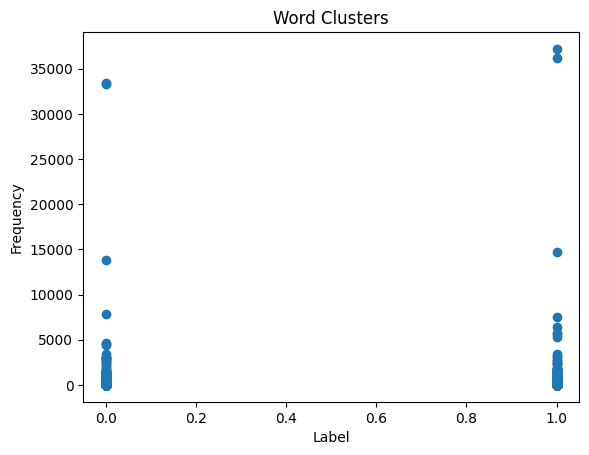

In [53]:
plot_word_clusters(ro_sent_train_pairs)

In [54]:
def calculate_word_probabilities(texts, label):
    # Create a dictionary to store the word counts
    word_counts = {}

    # Iterate through the texts and count the occurrences of each word
    for text in texts:
        if(text[1] == label):
            try:
                # Split the text into a list of words
                words = text[0].split(' ')

                # Increment the counts of the words
                for word in words:
                    if word in word_counts:
                        word_counts[word] += 1
                    else:
                        word_counts[word] = 1
            except:
                pass
    # Calculate the total number of words
    total_words = sum(word_counts.values())

    # Calculate the probabilities of the words
    word_probs = {}
    for word, count in word_counts.items():
        word_probs[word] = count / total_words

    return word_probs

In [55]:
word_probs_1 = calculate_word_probabilities(ro_sent_train_pairs, 1)
word_probs_0 = calculate_word_probabilities(ro_sent_train_pairs, 0)

In [56]:
word_probs_1

{'document': 3.397499440411857e-05,
 'eu': 0.0065052121638474085,
 'avea': 0.01128169667124996,
 'deschide': 0.00012390880312090303,
 'adevarat': 0.0017926805870879033,
 'ochi': 0.0004396763981709462,
 'om': 0.002552121638474083,
 'afara': 0.0003777219966104947,
 'stat': 0.00014988968119464073,
 'unit': 3.99705816519042e-05,
 'sine': 0.0015548556262590734,
 'gandi': 0.0004276852236753749,
 'atac': 4.796469798228504e-05,
 '11': 0.0001378985066990695,
 'septembrie': 5.396028523007067e-05,
 '.': 0.07227680427205577,
 'film': 0.029490295142774917,
 'construit': 2.198381990854731e-05,
 'expert': 3.397499440411857e-05,
 'prezint': 0.0002238352572506635,
 'dezastru': 4.796469798228504e-05,
 'fi': 0.0030797333162792184,
 'deca': 0.0006814984171649666,
 'pamant': 0.00017187350110318806,
 'american': 0.0004057014037668276,
 'urmarile': 1.99852908259521e-06,
 'previzionat': 1.99852908259521e-06,
 'tar': 0.00010192498321235571,
 'perspectiv': 3.99705816519042e-06,
 'diferit': 0.0005455984395484923

In [57]:
word_probs_0

{'nam': 4.467586542735816e-06,
 'gasit': 0.0002814579521923564,
 'nimik': 6.701379814103724e-06,
 'inteles': 0.00019210622133764008,
 'absolut': 0.0007349179862800418,
 'goooool': 2.233793271367908e-06,
 'revaze': 2.233793271367908e-06,
 'film': 0.030841983697776704,
 ',': 0.07445903111450648,
 'nostalgic': 1.7870346170943263e-05,
 '...': 0.005897214236411277,
 'nenorocire': 3.1273105799150714e-05,
 'priv': 6.701379814103723e-05,
 'lucru': 0.004898708644109822,
 '.': 0.0746667738887437,
 'pacat': 0.0004959021062436755,
 'amintire': 6.924759141240514e-05,
 'copilarie': 3.1273105799150714e-05,
 'fi': 0.003297078868539032,
 'complet': 0.000851075236391173,
 'neincrezator': 4.467586542735816e-06,
 'pericolă': 6.701379814103724e-06,
 'paulin': 4.467586542735816e-06,
 'dezvaluit': 1.3402759628207448e-05,
 'acum': 0.0011593387078399442,
 'exercitiu': 5.137724524146188e-05,
 'jenant': 0.0001116896635683954,
 'filmare': 0.0001675344953525931,
 'banală': 2.233793271367908e-05,
 'rasistă': 1.3402

In [63]:
def plot_words_by_label(label1, words1, probs1, label2, words2, probs2, x=20, y=100):
  # Create a dictionary to store the words and probabilities for each label
    data = {
        label1: {'words': words1, 'probs': probs1},
        label2: {'words': words2, 'probs': probs2},
    }

    # Extract the words and probabilities for each label
    words = []
    probs = []
    labels = []
    for label, label_data in data.items():
        words.extend(label_data['words'])
        probs.extend(label_data['probs'])
        labels.extend([label] * len(label_data['words']))

    # Plot the points
    
    plt.rcdefaults()
    plt.figure(figsize=(x, y))
    plt.scatter(probs, words, c=labels)
    plt.xlabel('Probability')
    plt.ylabel('Word')
    plt.title('Words by Label')
    plt.show()

In [59]:
words1 = list(word_probs_1.keys())
probs1 = list(word_probs_1.values())
words0 = list(word_probs_0.keys())
probs0 = list(word_probs_0.values())

In [60]:
# %matplotlib inline
plot_words_by_label('1',words1,probs1,'0',words0,probs0,40,400)

C:\Misc\GIT\DLNLPProject\venv\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 3 () missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


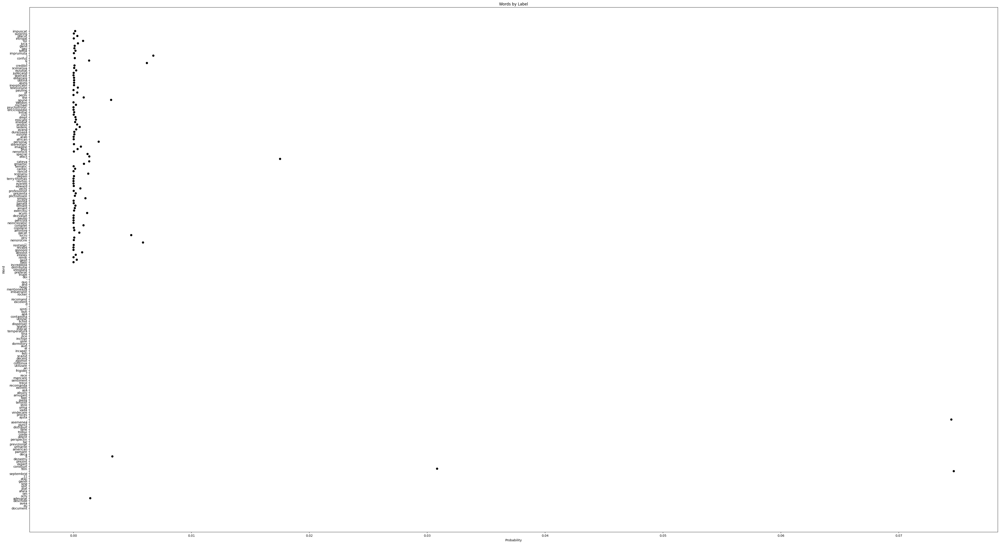

In [66]:
plot_words_by_label('1',words1[:100],probs1[:100],'0',words0[:100],probs0[:100],55,30)

In [68]:
words1[:100],probs1[:100]


(['document',
  'eu',
  'avea',
  'deschide',
  'adevarat',
  'ochi',
  'om',
  'afara',
  'stat',
  'unit',
  'sine',
  'gandi',
  'atac',
  '11',
  'septembrie',
  '.',
  'film',
  'construit',
  'expert',
  'prezint',
  'dezastru',
  'fi',
  'deca',
  'pamant',
  'american',
  'urmarile',
  'previzionat',
  'tar',
  'perspectiv',
  'diferit',
  'crede',
  'trebui',
  'bine',
  'distribuit',
  'punct',
  'asemenea',
  ',',
  'ajuta',
  'proces',
  'vindecare',
  'vadă',
  'urma',
  'stire',
  'terorist',
  'piesă',
  'fapt',
  'amuzant',
  'abuziv',
  'asă',
  'extrem',
  'recomanda',
  'trece',
  'sentiment',
  'mancare',
  'rece',
  '?',
  'frigider',
  'an',
  'utilizare',
  'continua',
  'zgomot',
  'decent',
  'scazut',
  'esti',
  'incaper',
  'el',
  'auzi',
  'dormitory',
  'usile',
  'inchise',
  'zice',
  'tina',
  'temperatură',
  'indicat',
  'spalati',
  'dispenser',
  'lichid',
  'utilizar',
  'contamina',
  'apă',
  'bun',
  'simți',
  ':',
  'd',
  'excelent',
  'reco

In [69]:
words0,probs0

(['nam',
  'gasit',
  'nimik',
  'inteles',
  'absolut',
  'goooool',
  'revaze',
  'film',
  ',',
  'nostalgic',
  '...',
  'nenorocire',
  'priv',
  'lucru',
  '.',
  'pacat',
  'amintire',
  'copilarie',
  'fi',
  'complet',
  'neincrezator',
  'pericolă',
  'paulin',
  'dezvaluit',
  'acum',
  'exercitiu',
  'jenant',
  'filmare',
  'banală',
  'rasistă',
  'simplu',
  'plictisitoare',
  'prezenta',
  'profesionist',
  'vechi',
  'edward',
  'everett',
  'Horton',
  'terry-thomas',
  'depasi',
  'scenariu',
  'rancid',
  'cantec',
  'tematic',
  'groaznic',
  'cateva',
  '"',
  'efect',
  'special',
  'nenorocit',
  'plus',
  'imagine',
  'stereotipic',
  'personaj',
  'african',
  'arab',
  'viziune',
  'dureroasă',
  'avand',
  'vedere',
  'produs',
  'imediat',
  'miscare',
  'drept',
  'civil',
  'initial',
  'enciclopedie',
  'psychotronic',
  'michael',
  'Weldon',
  'spune',
  'the',
  'perils',
  'of',
  'pauline',
  'televiziune',
  'inexplicabil',
  'ajuns',
  'obtină',
 

In [70]:
len(word_probs_1)

37134

In [71]:
len(word_probs_0)

35226